In [1]:
import Stripeline as Sl
using Healpix
using PRMaps
using Plots

In [2]:
function pipeline_hist(error)
    signal = readMapFromFITS("../input_maps/map_40GHz.fits", 2, Float64)

    days_of_observation = 2.
    fsampl_hz = 59.9
    total_time_s = days_of_observation * 24 * 3600

    setup = Setup(
        τ_s = 1. / fsampl_hz,
        times = 0 : (1. / fsampl_hz) : total_time_s,
        NSIDE = 512
    )

    # We simulate the I0 horn that point towards [0.0,0.0,1.0]
    cam_ang = Sl.CameraAngles()
    
    ideal_map, ideal_hit = makeIdealMap(cam_ang, signal, setup)
    
    w2_TA = Sl.TelescopeAngles(wheel2ang_0_rad = error)
    w3_TA = Sl.TelescopeAngles(wheel3ang_0_rad = error)
    fork_TA = Sl.TelescopeAngles(forkang_rad = error)
    wω0_TA = Sl.TelescopeAngles(zVAXang_rad = error, omegaVAXang_rad = deg2rad(0.0))
    wω90_TA = Sl.TelescopeAngles(zVAXang_rad = error, omegaVAXang_rad = deg2rad(90.0))
    wω180_TA = Sl.TelescopeAngles(zVAXang_rad = error, omegaVAXang_rad = deg2rad(180.0))
    wω270_TA = Sl.TelescopeAngles(zVAXang_rad = error, omegaVAXang_rad = deg2rad(270.0))


    w2_Map, w2_Hit = makeErroredMap(cam_ang, w2_TA, signal, setup)
    w3_Map, w3_Hit = makeErroredMap(cam_ang, w3_TA, signal, setup)
    fork_Map, fork_Hit = makeErroredMap(cam_ang, fork_TA, signal, setup)
    wω0_Map, wω0_Hit = makeErroredMap(cam_ang, wω0_TA, signal, setup)
    wω90_Map, wω90_Hit = makeErroredMap(cam_ang, wω90_TA, signal, setup)
    wω180_Map, wω180_Hit = makeErroredMap(cam_ang, wω180_TA, signal, setup)
    wω270_Map, wω270_Hit = makeErroredMap(cam_ang, wω270_TA, signal, setup)

    errored_maps = [w2_Map, w3_Map, fork_Map, wω0_Map, wω90_Map, wω180_Map, wω270_Map]
    errored_hits = [w2_Hit, w3_Hit, fork_Hit, wω0_Hit, wω90_Hit, wω180_Hit, wω270_Hit]
    return (errored_maps, errored_hits, ideal_map, ideal_hit)
end

pipeline_hist (generic function with 1 method)

In [3]:
(errored_map, errored_hit, ideal_map, ideal_hit) = pipeline_hist(deg2rad(1.0))
nothing

In [4]:
error_1 = [ (i - ideal_map)[isfinite.(i-ideal_map)] for i in errored_map]
abs_error_1 = [ abs.(i) for i in error_1 ]

labels = ["Altitude_offset 1°" "Ground_offset 1°" "Fork 1°" "z = 1° & ω = 0°" "z = 1° & ω = 90°" "z = 1° & ω = 180°" "z = 1° & ω = 270°"]

nothing

1×7 Matrix{String}:
 "Altitude_offset 1°"  "Ground_offset 1°"  "Fork 1°"  …  "Z = 1° & ω = 270°"

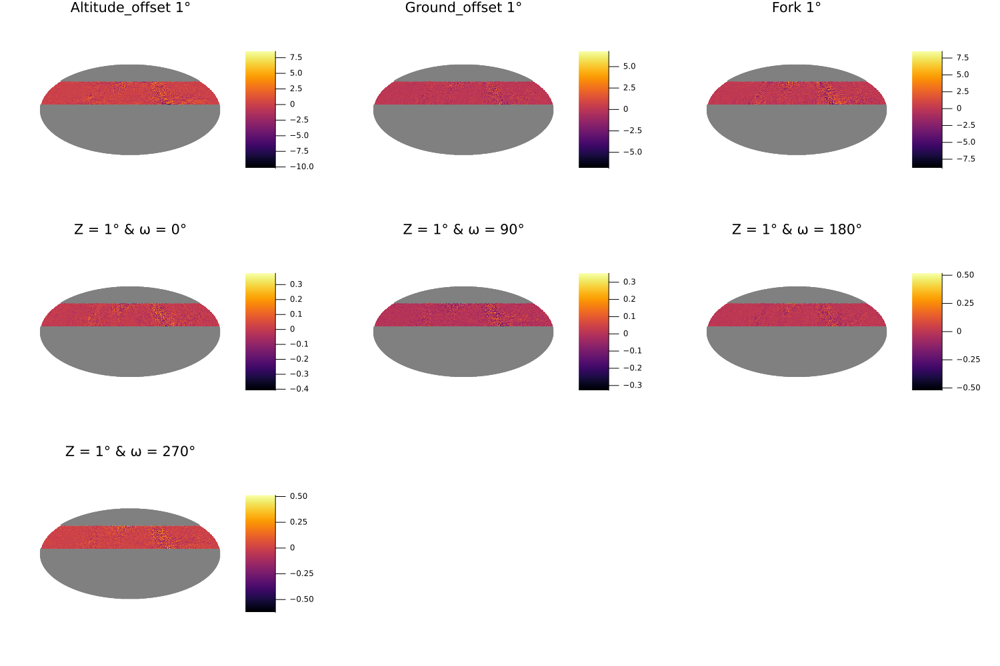

In [5]:
p = [plot(i-ideal_map) for i in errored_map]
plot(p..., layout = (3,3), size = (1500,1000), title = labels)

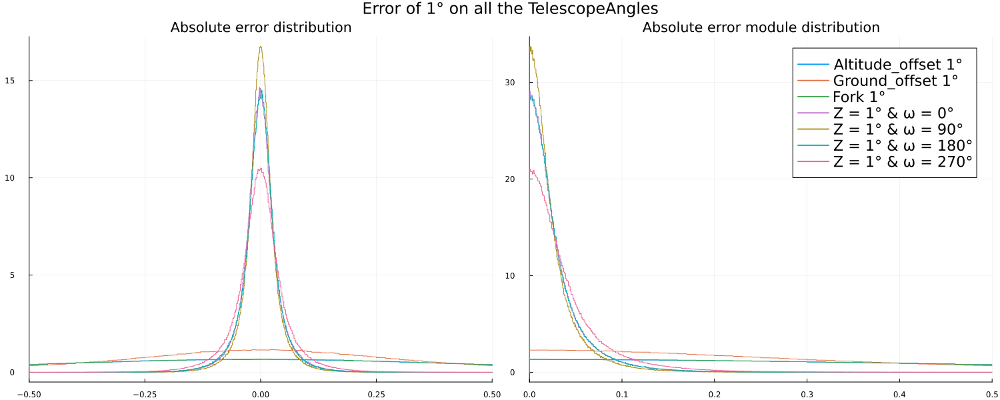

In [23]:
a = stephist([error_1...], label = labels, xlims = (-0.5,0.5), normalize = true, legend=false, title = "Absolute error distribution")
b = stephist([abs_error_1...], label = labels, xlims = (0,0.5), normalize = true, title = "Absolute error module distribution", legendfontsize = 15)
plot(a,b, size = (1500, 600),thickness_scaling = 1, plot_title = "Error of 1° on all the TelescopeAngles")

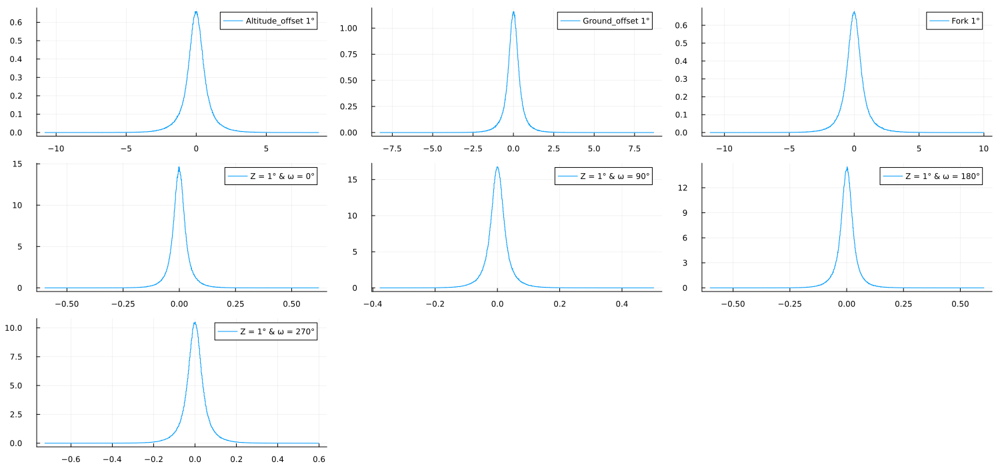

In [22]:
hists = [stephist(i, normalize = true) for i in error_1]
plot(hists..., label = labels, size = (1500,700))